# **Style transfer with CycleGAN**

Here we'll build and train CycleGAN for Img2Imgs task

The __Img2Img__ task:

- We have two sets of images ($A$ и $B$)

- Our task - convert images from $A$ set to $B$ set and vice versa

- We're gonna work here with __unpaired__ sets - there is no mapping between images from different sets, i.e. for an image from set $A$ there is no corresponding image from set $B$. There are _paired_ sets where the mapping exists, like (a) a satelite image and (b) the corresponding standard (vector) map.

<br>

For this task we're gonna use __CycleGAN__ model:


- This model is for Img2Img tasks (mainly for unpaired version)

- The model has 2 generators: $G_{A -> B}$ (its task - take an input image from set $A$ and convert it to an image from set $B$) and $G_{B -> A}$ (the other way around)

- The generators don't take as input any additional randomness which makes training of these models easier.

- The model also has 2 discriminators $D_{A}$ - for distinguishing real $A$ images from generated ones and similarly $D_{B}$ for $B$ images.

- The loss function is the minmax game between generators and
discriminators as usual for GANs and `cycle consistency loss` additionally. `cycle consistency loss` checks that after the double conversion the images don't change $G_{B -> A} \big( G_{A -> B} ( a ) \big) = a ; \forall a \in A$ и $G_{A -> B} \big( G_{B -> A} ( b ) \big) = b ; \forall b \in B$

- Also we can include the penalty for $G_{B -> A}$ doesn't change the images from $A$ and likewise $G_{A -> B}$ doesn't change the images from $B$

- The original paper : https://arxiv.org/pdf/1703.10593.pdf

In [1]:
%uv pip install opencv-python termcolor

Using Python 3.12.6 environment at: /usr/local
Resolved 3 packages in 50ms
⠙ Preparing packages... (0/2)
⠙ Preparing packages... (0/2)
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  ------------------------------ 7.55 KiB/7.55 KiB
⠙ Preparing packages... (0/2)
termcolor  --------------

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from torchvision import datasets, transforms as tr

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('dark_background')

from tqdm.auto import tqdm, trange

import os
import sys
import requests
import cv2

from dataclasses import dataclass
import itertools

# 1. Data preparation

## 1.1 Downloading dataset

In [ ]:
from pathlib import Path
import shutil
import zipfile
import requests
from tqdm.auto import tqdm

dataset_name = "vangogh2photo"

# Persistent archive in the Modal Volume
volume_dataset_folder = Path(
    "/mnt/cyclegan-storage/datasets"
)
volume_archive_path = (
    volume_dataset_folder / f"{dataset_name}.zip"
)
partial_archive_path = (
    volume_dataset_folder / f"{dataset_name}.zip.part"
)

# Extracted dataset on fast ephemeral storage
dataset_folder_path = Path("/tmp/img2img")
target_folder_path = (
    dataset_folder_path / dataset_name
)

url = (
    "http://efrosgans.eecs.berkeley.edu/"
    f"cyclegan/datasets/{dataset_name}.zip"
)

expected_splits = (
    "trainA",
    "trainB",
    "testA",
    "testB",
)


def dataset_is_ready(path):
    return all(
        (path / split).is_dir()
        and any((path / split).iterdir())
        for split in expected_splits
    )


volume_dataset_folder.mkdir(
    parents=True,
    exist_ok=True,
)
dataset_folder_path.mkdir(
    parents=True,
    exist_ok=True,
)


# Download the ZIP into the Volume only when it is missing.
if volume_archive_path.exists():
    if not zipfile.is_zipfile(volume_archive_path):
        raise RuntimeError(
            f"The existing archive is invalid:\n"
            f"{volume_archive_path}\n"
            "Delete it and rerun this cell."
        )

    print(
        f"Using existing archive from Volume:\n"
        f"{volume_archive_path}"
    )

else:
    # Remove an incomplete previous download.
    partial_archive_path.unlink(
        missing_ok=True,
    )

    print(
        f"Downloading {dataset_name} to Volume:\n"
        f"{volume_archive_path}"
    )

    try:
        with requests.get(
            url,
            stream=True,
            timeout=(30, 600),
        ) as response:
            response.raise_for_status()

            total_size = int(
                response.headers.get(
                    "content-length",
                    0,
                )
            )

            with open(
                partial_archive_path,
                "wb",
            ) as output_file:
                with tqdm(
                    total=total_size or None,
                    unit="B",
                    unit_scale=True,
                    desc="Downloading",
                ) as progress:
                    for chunk in response.iter_content(
                        chunk_size=1024 * 1024
                    ):
                        if chunk:
                            output_file.write(chunk)
                            progress.update(len(chunk))

        if not zipfile.is_zipfile(
            partial_archive_path
        ):
            raise RuntimeError(
                "The downloaded file is not a valid ZIP archive."
            )

        # Rename only after the download is complete and valid.
        partial_archive_path.replace(
            volume_archive_path
        )

        print("Archive saved to the Volume.")

    except Exception:
        partial_archive_path.unlink(
            missing_ok=True,
        )
        raise


# Extract into /tmp only when the local dataset is missing.
if dataset_is_ready(target_folder_path):
    print(
        f"Using existing extracted dataset:\n"
        f"{target_folder_path}"
    )

else:
    # Remove only an incomplete ephemeral extraction.
    if target_folder_path.exists():
        shutil.rmtree(target_folder_path)

    print(
        f"Extracting archive from Volume into:\n"
        f"{dataset_folder_path}"
    )

    with zipfile.ZipFile(
        volume_archive_path,
        "r",
    ) as archive:
        archive.extractall(
            dataset_folder_path
        )

    if not dataset_is_ready(
        target_folder_path
    ):
        raise RuntimeError(
            f"Dataset extraction is incomplete:\n"
            f"{target_folder_path}"
        )

    print("Dataset extracted successfully.")


# Strings expected by the rest of the notebook
dataset_folder = str(dataset_folder_path)
target_folder = str(target_folder_path)

print(f"\nDataset path: {target_folder}")

for split in expected_splits:
    split_path = (
        target_folder_path / split
    )

    image_count = sum(
        path.is_file()
        for path in split_path.iterdir()
    )

    print(f"{split}: {image_count} images")

## 1.2 Dataset и Transforms

In the folder `target_folder` there are several folders with splits, each split folder contains `.jpg` images.

For convenience, let's arrange them in different datasets one for each split and without labels

In [4]:
class ImageDatasetNoLabel(Dataset):
    def __init__(self, dataset_path, transforms=None):
        super(ImageDatasetNoLabel, self).__init__()
        self.images = [cv2.imread(os.path.join(dataset_path, img_path))[:, :, ::-1].copy() for img_path in sorted(os.listdir(dataset_path))]
        self.transforms = transforms

    def __getitem__(self, index):
        # if isinstance(index, slice):
        #     return [self.transforms(img) for img in self.images[index]]
        if self.transforms:
            return self.transforms(self.images[index])
        return self.images[index]

    def __len__(self):
        return len(self.images)

# Handy class for storing our datasets
@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


# All the datasets are without transforms - to calculate the statistics
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

In [5]:
def get_channel_statistics(dataset):
    """
    A function for obtaining per-channel statistics (mean and variance) for a dataset
    """
    channel_sum = torch.zeros(3, dtype=torch.float64)
    channel_sum_sq = torch.zeros(3, dtype=torch.float64)
    pixel_count = 0

    for image in dataset:
        # NumPy uint8 -> tensor in [0, 1]
        image = torch.from_numpy(image).to(torch.float64) / 255.0

        channel_sum += image.sum(dim=(0, 1))
        channel_sum_sq += (image ** 2).sum(dim=(0, 1))
        pixel_count += image.shape[0] * image.shape[1]

    channel_mean = channel_sum / pixel_count
    channel_variance = channel_sum_sq / pixel_count - channel_mean ** 2
    channel_std = torch.sqrt(channel_variance.clamp(min=0))

    return channel_mean.float(), channel_std.float()

channel_mean_a, channel_std_a = get_channel_statistics(ds.train_a)
print(channel_mean_a, channel_std_a)

channel_mean_b, channel_std_b = get_channel_statistics(ds.train_b)
print(channel_mean_b, channel_std_b)

tensor([0.5184, 0.4952, 0.3370]) tensor([0.2529, 0.2304, 0.2307])
tensor([0.4123, 0.4093, 0.3927]) tensor([0.2711, 0.2487, 0.2778])


Experiments show that plain mean = [0.5, 0.5, 0.5] and std = [0.5, 0.5, 0.5] works better with __tanh__ function than using the actua meand and std and meets the original paper flow

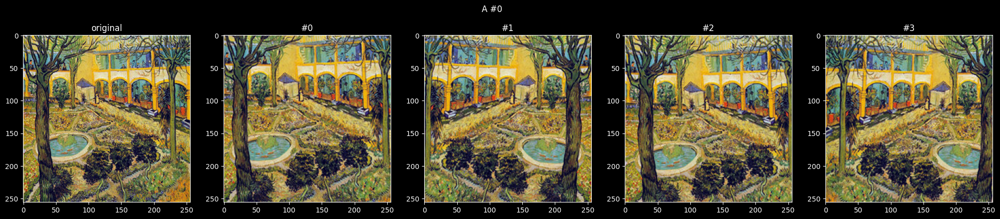

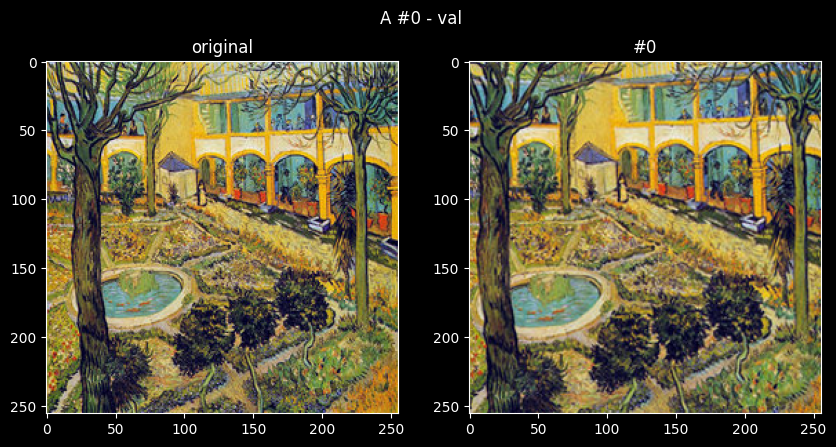

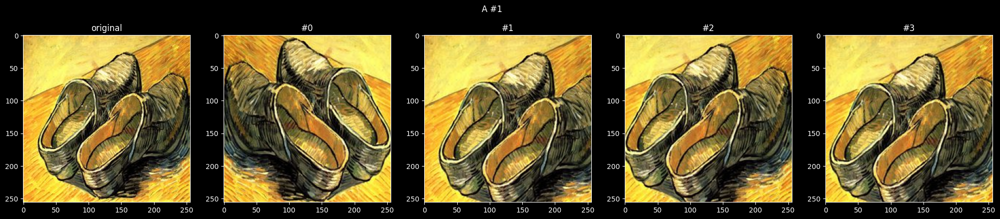

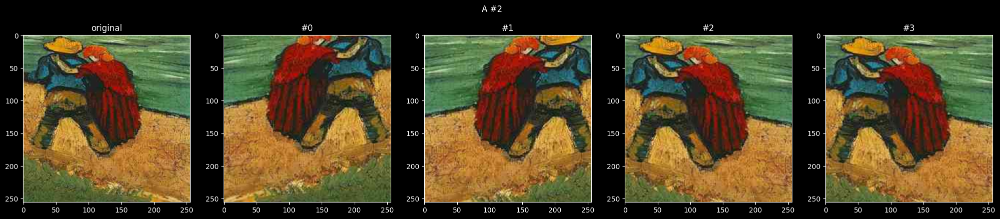

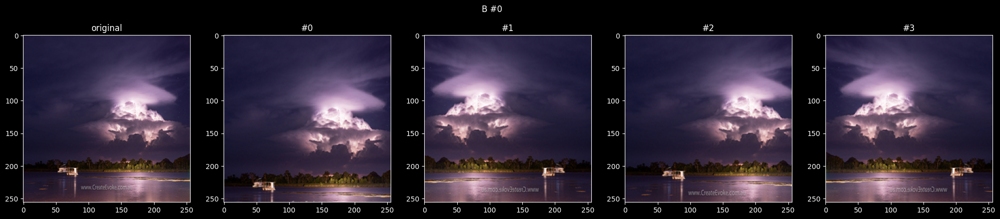

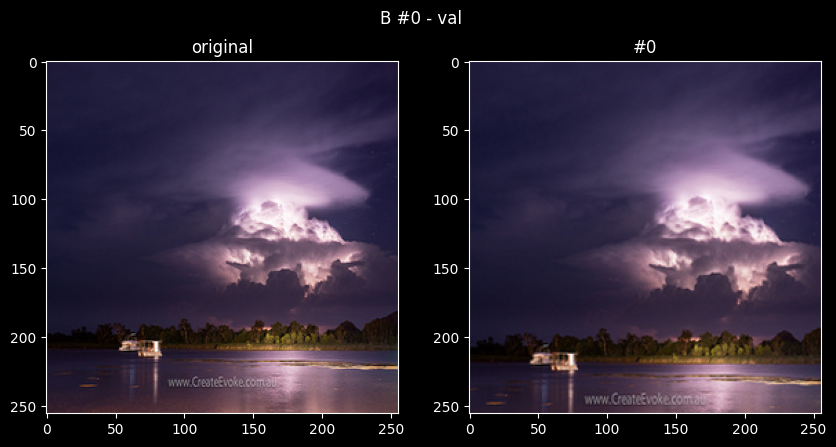

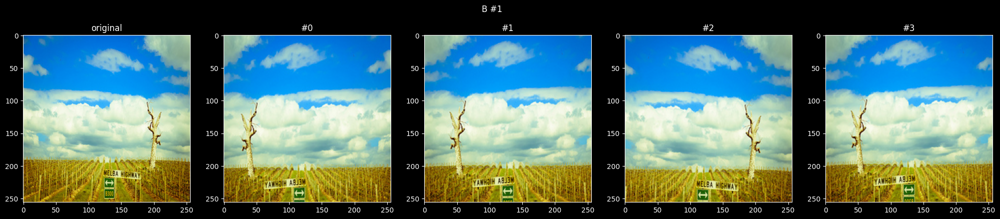

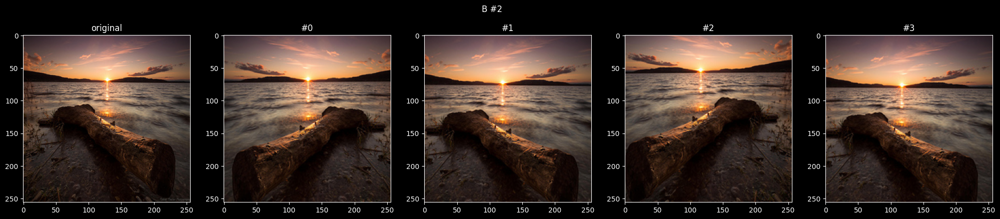

In [6]:
# A function for getting train and val transforms and functions for reverting normalisation of an image
def get_transforms(mean, std, img_size=224, resize_size=256):
    train_transform = tr.Compose([
        tr.ToTensor(),
        tr.Resize(resize_size, interpolation=tr.InterpolationMode.BICUBIC),
        tr.RandomCrop(img_size),
        tr.RandomHorizontalFlip(),
        tr.Normalize(mean=mean, std=std)
    ])

    test_transform = tr.Compose([
        tr.ToTensor(),
        tr.Resize(resize_size, interpolation=tr.InterpolationMode.BICUBIC),
        tr.CenterCrop(img_size),
        tr.Normalize(mean=mean, std=std)
    ])

    def de_normalize(img, normalized=True):
        for i in range(3):
            img[i] = img[i] * std[i] + mean[i]
        img = img.permute(1, 2, 0).cpu().numpy().clip(0, 1)
        return img

    return train_transform, test_transform, de_normalize


hyperparams = {
    "img_size": 256,
    "resize_size": 286,
}

train_transform_a, val_transform_a, de_normalize_a = get_transforms(mean=torch.tensor([0.5]*3), std=torch.tensor([0.5]*3), **hyperparams)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(mean=torch.tensor([0.5]*3), std=torch.tensor([0.5]*3), **hyperparams)


# Transforms visualisation
def show_examples(dataset, transform, de_norm, num_per_image=3, image_index=0, title=""):
    fig, ax = plt.subplots(1, 1 + num_per_image, figsize=(5 * (1 + num_per_image), 5))

    image = dataset[image_index]

    plt.suptitle(title, y=0.95)

    plt.subplot(1, 1 + num_per_image, 1)
    plt.imshow(image)
    plt.title("original")

    for i in range(num_per_image):
        plt.subplot(1, 1 + num_per_image, i + 2)
        plt.title(f"#{i}")
        plt.imshow(de_norm(transform(image)))
    plt.show()

# Sanity check
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=0, title="A #0")
show_examples(ds.train_a, val_transform_a, de_normalize_a, num_per_image=1, image_index=0, title="A #0 - val")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=1, title="A #1")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=2, title="A #2")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=0, title="B #0")
show_examples(ds.train_b, val_transform_b, de_normalize_b, num_per_image=1, image_index=0, title="B #0 - val")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=1, title="B #1")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=2, title="B #2")

In [7]:
# All datasets with transforms
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transforms=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transforms=train_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transforms=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transforms=val_transform_b,
    ),
)

## 1.3 DataLoader

In [8]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader

batch_size = 1

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
)

# 2. Model

## 2.0 Helper modules and classes

In [9]:
class ResidualBlock(nn.Module):
    def __init__(self, num_channels, padding_mode='reflect'):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(num_channels, num_channels, kernel_size=3, padding=1, padding_mode=padding_mode),
            nn.InstanceNorm2d(num_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(num_channels, num_channels, kernel_size=3, padding=1, padding_mode=padding_mode),
            nn.InstanceNorm2d(num_channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, padding_mode='reflect'):
        super().__init__()
        self.padding_mode = padding_mode

        blocks = []

        blocks.append(nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, padding=3, padding_mode=padding_mode),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ))

        for i in range(2):
            in_channels = 64 * (2 ** i)
            out_channels = in_channels * 2

            blocks.append(nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, stride=2, padding_mode=self.padding_mode),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ))

        out_channels = 64 * 4
        for i in range(9):
            blocks.append(ResidualBlock(out_channels, padding_mode))

        for i in range(2):
            in_channels = out_channels
            out_channels = int(in_channels // 2)

            blocks.append(nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=3, padding=1, output_padding=1, stride=2),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True)
            ))

        blocks.append(nn.Sequential(
            nn.Conv2d(out_channels, 3, kernel_size=7, padding=3, padding_mode=padding_mode),
            nn.Tanh()
        ))

        self.model = nn.Sequential(*blocks)

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        blocks = []

        blocks.append(nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        ))

        in_channels = 64
        for i in range(2):
            blocks.append(nn.Sequential(
                nn.Conv2d(in_channels, in_channels * 2, kernel_size=4, padding=1, stride=2),
                nn.InstanceNorm2d(in_channels * 2),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            ))
            in_channels *= 2

        blocks.append(nn.Sequential(
            nn.Conv2d(in_channels, in_channels * 2, kernel_size=4, padding=1, stride=1),
            nn.InstanceNorm2d(in_channels * 2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        ))
        in_channels *= 2

        blocks.append(
            nn.Conv2d(in_channels, 1, kernel_size=4, padding=1, stride=1)
        )

        self.model = nn.Sequential(*blocks)

    def forward(self, x):
        return self.model(x)

In [10]:
import random

class ImagePool():
    def __init__(self, pool_size):
        self.pool_size = pool_size
        self.num_imgs = 0
        self.images = []

    def get_image(self, images):
        returned_images = []
        for image in images:
            image = image.detach().unsqueeze(0)
            if self.num_imgs < self.pool_size:
                self.num_imgs += 1
                self.images.append(image)
                returned_images.append(image)
            else:
                p = random.uniform(0, 1)
                if p > 0.5:
                    random_id = random.randint(0, self.pool_size - 1)
                    buffed_img = self.images[random_id].clone()
                    self.images[random_id] = image
                    returned_images.append(buffed_img)
                else:
                    returned_images.append(image)
        returned_images = torch.cat(returned_images, 0)
        return returned_images

## 2.1 Network architecture

In [11]:
class CycleGAN(nn.Module):
    def __init__(self, pool_size=50):
        super(CycleGAN, self).__init__()
        self.generator_A = Generator()
        self.generator_B = Generator()

        self.discriminator_A = Discriminator()
        self.discriminator_B = Discriminator()

        self.img_pool_A = ImagePool(pool_size)
        self.img_pool_B = ImagePool(pool_size)

    def get_image(self, images, domain):
        if domain == 'A':
            return self.img_pool_A.get_image(images)
        elif domain == 'B':
            return self.img_pool_B.get_image(images)

## 2.2 Loss

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [12]:
class CycleConsistencyLoss(nn.Module):
    """
    A loss function checks that the image has not changed after a double pass through the generators.
    """
    def __init__(self):
        super(CycleConsistencyLoss, self).__init__()
        self.loss = nn.L1Loss()

    def forward(self, x, x_rec):
        # Takes the original image and the image after the double pass as input
        return self.loss(x_rec, x)

$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [13]:
class AdversarialLossCE(nn.Module):
    """
    Standard minmax loss function
    """
    def __init__(self):
        super(AdversarialLossCE, self).__init__()
        self.loss = nn.BCEWithLogitsLoss()
        self.true_label = torch.tensor(1.)
        self.false_label = torch.tensor(0.)

    def forward(self, fake_pred, real_pred=None):
        # Takes D_{A}(a) - real_pred and D_{A}(G(b)) - fake_pred or vice versa
        # Can take only one argument for convenience in case generator or discrimniator training
        if real_pred is None:
            return self.loss(fake_pred, self.true_label.to(fake_pred.device))
        else:
            return self.loss(fake_pred, self.false_label.to(fake_pred.device)) + self.loss(real_pred, self.true_label.to(real_pred.device))

$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [14]:
class AdversarialLossMSE(nn.Module):
    def __init__(self):
        super(AdversarialLossMSE, self).__init__()
        self.loss = nn.MSELoss()

    def forward(self, fake_pred, real_pred=None):
        if real_pred is None:
            return self.loss(fake_pred, torch.ones_like(fake_pred))
        
        fake_loss = self.loss(
            fake_pred,
            torch.zeros_like(fake_pred),
        )
        real_loss = self.loss(
            real_pred,
            torch.ones_like(real_pred),
        )

        return fake_loss + real_loss

In [15]:
class IdentityLoss(nn.Module):
    def __init__(self):
        super(IdentityLoss, self).__init__()
        self.loss = nn.L1Loss()

    def forward(self, fake, real):
        return self.loss(fake, real)

$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [16]:
class FullDiscriminatorLoss(nn.Module):
    """
    Full discriminator loss
    """
    def __init__(self, is_mse=True):
        super(FullDiscriminatorLoss, self).__init__()
        self.adversarial_loss_func = AdversarialLossMSE() if is_mse else AdversarialLossCE()

    def forward(self, predict_real, predict_fake):
        return 0.5 * self.adversarial_loss_func(predict_fake, predict_real)

In [17]:
class FullGeneratorLoss(nn.Module):
    """
    Full generator loss
    """
    def __init__(self, lambda_value=10., lambda_idt=0.5, is_mse=True):
        super(FullGeneratorLoss, self).__init__()
        self.adversarial_loss_func = AdversarialLossMSE() if is_mse else AdversarialLossCE()
        self.identity_loss = IdentityLoss()
        self.cycle_consistency_loss_func = CycleConsistencyLoss()
        self.cycle_lambda = lambda_value
        self.idt_lambda = lambda_idt

    def forward(
        self,
        fake_idt,
        fake_pred,
        rec,
        real
    ):
        idt_loss = self.identity_loss(fake_idt, real)

        gan_loss = self.adversarial_loss_func(fake_pred)

        cycle_loss = self.cycle_consistency_loss_func(rec, real)

        loss = gan_loss + (self.cycle_lambda * cycle_loss) + (self.cycle_lambda * self.idt_lambda * idt_loss)
        return loss

# 3. Training preparation

## 3.1 Discriminator step

In [18]:
def set_requires_grad(modules, requires_grad):
    for module in modules:
        for parameter in module.parameters():
            parameter.requires_grad_(requires_grad)


def discriminator_step(model, opt_d, imgs_a, imgs_b, fake_A, fake_B, criterion):
    set_requires_grad([model.discriminator_A, model.discriminator_B], True)
    opt_d.zero_grad(set_to_none=True)

    pred_A_real = model.discriminator_B(imgs_a)
    pred_B_real = model.discriminator_A(imgs_b)

    # Reusing the fake images 
    fake_A = model.get_image(fake_A, 'A')
    fake_B = model.get_image(fake_B, 'B')
    pred_A_fake = model.discriminator_B(fake_A)
    pred_B_fake = model.discriminator_A(fake_B)

    loss_d = criterion(pred_A_real, pred_A_fake) + criterion(pred_B_real, pred_B_fake)
    loss_d.backward()
    opt_d.step()

    return loss_d.item()

## 3.2 Generator step

In [19]:
def generator_step(model, opt_g, imgs_a, imgs_b, criterion):
    set_requires_grad([model.discriminator_A, model.discriminator_B], False)
    opt_g.zero_grad(set_to_none=True)

    fake_B = model.generator_A(imgs_a)
    fake_A = model.generator_B(imgs_b)

    pred_A_fake = model.discriminator_B(fake_A)
    pred_B_fake = model.discriminator_A(fake_B)

    rec_B = model.generator_A(fake_A)
    rec_A = model.generator_B(fake_B)

    idt_A = model.generator_B(imgs_a)
    idt_B = model.generator_A(imgs_b)

    loss_G_A = criterion(idt_A, pred_A_fake, rec_A, imgs_a)
    loss_G_B = criterion(idt_B, pred_B_fake, rec_B, imgs_b)
    loss_g = loss_G_A + loss_G_B

    loss_g.backward()
    opt_g.step()

    return loss_g.item(), fake_A.detach(), fake_B.detach()

## 3.3 Validation step

In [20]:
from collections import defaultdict

def val(model, loader_a, loader_b, criterion_d, criterion_g, is_mse_pred=True):
    model.eval()

    val_data = defaultdict(list)

    with torch.no_grad():
        iter_a = iter(loader_a)
        iter_b = iter(loader_b)
        batches_per_epoch = min(len(iter_a), len(iter_b))

        for _ in trange(batches_per_epoch):
            imgs_a = next(iter_a).to(device)
            imgs_b = next(iter_b).to(device)

            a_real_pred = model.discriminator_B(imgs_a)
            b_real_pred = model.discriminator_A(imgs_b)

            fake_B = model.generator_A(imgs_a).detach()
            fake_A = model.generator_B(imgs_b).detach()

            a_fake_pred = model.discriminator_B(fake_A)
            b_fake_pred = model.discriminator_A(fake_B)

            loss_d = criterion_d(a_real_pred, a_fake_pred) + criterion_d(b_real_pred, b_fake_pred)

            rec_B = model.generator_A(fake_A)
            rec_A = model.generator_B(fake_B)

            idt_A = model.generator_B(imgs_a)
            idt_B = model.generator_A(imgs_b)

            loss_g = criterion_g(idt_A, a_fake_pred, rec_A, imgs_a) + criterion_g(idt_B, b_fake_pred, rec_B, imgs_b)

            val_data["loss D"].append(loss_d.item())
            val_data["loss G"].append(loss_g.item())

            a_real_score = a_real_pred.mean(dim=(1, 2, 3))
            b_real_score = b_real_pred.mean(dim=(1, 2, 3))
            a_fake_score = a_fake_pred.mean(dim=(1, 2, 3))
            b_fake_score = b_fake_pred.mean(dim=(1, 2, 3))

            if not is_mse_pred:
                a_real_score = torch.sigmoid(a_real_score)
                b_real_score = torch.sigmoid(b_real_score)
                a_fake_score = torch.sigmoid(a_fake_score)
                b_fake_score = torch.sigmoid(b_fake_score)

            val_data["real pred A"].extend(a_real_score.cpu().detach().tolist())
            val_data["real pred B"].extend(b_real_score.cpu().detach().tolist())
            val_data["fake pred A"].extend(a_fake_score.cpu().detach().tolist())
            val_data["fake pred B"].extend(b_fake_score.cpu().detach().tolist())

        val_data["loss D"] = np.mean(val_data["loss D"])
        val_data["loss G"] = np.mean(val_data["loss G"])

    return val_data

## 3.4 Visualisation of the generated results

In [21]:
def draw_imgs(
    model,
    num_images,
    loader_a,
    loader_b,
    de_norm_a,
    de_norm_b,
    save_folder,
    epoch,
):
    model.eval()

    with torch.no_grad():
        imgs_a = []

        for batch in loader_a:
            imgs_a.append(batch)

            if len(torch.cat(imgs_a)) >= num_images:
                break

        imgs_a = torch.cat(imgs_a)[:num_images].to(device)

        imgs_b = []

        for batch in loader_b:
            imgs_b.append(batch)

            if len(torch.cat(imgs_b)) >= num_images:
                break

        imgs_b = torch.cat(imgs_b)[:num_images].to(device)

        fake_a = model.generator_B(imgs_b)
        fake_b = model.generator_A(imgs_a)

        rec_a = model.generator_B(fake_b)
        rec_b = model.generator_A(fake_a)

        # Domain A images
        fig_a, axes_a = plt.subplots(
            num_images,
            3,
            figsize=(18, 5 * num_images),
            squeeze=False,
        )
        fig_a.suptitle(f"Domain A — epoch {epoch}")

        for index in range(num_images):
            axes_a[index, 0].imshow(
                de_norm_a(
                    imgs_a[index].clone(),
                    normalized=True,
                )
            )
            axes_a[index, 0].set_title("Original A")

            axes_a[index, 1].imshow(
                de_norm_b(
                    fake_b[index].clone(),
                    normalized=True,
                )
            )
            axes_a[index, 1].set_title("Translated to B")

            axes_a[index, 2].imshow(
                de_norm_a(
                    rec_a[index].clone(),
                    normalized=True,
                )
            )
            axes_a[index, 2].set_title("Reconstructed A")

            for axis in axes_a[index]:
                axis.set_xticks([])
                axis.set_yticks([])

        fig_a.tight_layout()

        domain_a_path = os.path.join(
            save_folder,
            f"generated_A_epoch_{int(epoch):04d}.png",
        )

        fig_a.savefig(
            domain_a_path,
            dpi=120,
            bbox_inches="tight",
        )
        plt.close(fig_a)

        # Domain B images
        fig_b, axes_b = plt.subplots(
            num_images,
            3,
            figsize=(18, 5 * num_images),
            squeeze=False,
        )
        fig_b.suptitle(f"Domain B — epoch {epoch}")

        for index in range(num_images):
            axes_b[index, 0].imshow(
                de_norm_b(
                    imgs_b[index].clone(),
                    normalized=True,
                )
            )
            axes_b[index, 0].set_title("Original B")

            axes_b[index, 1].imshow(
                de_norm_a(
                    fake_a[index].clone(),
                    normalized=True,
                )
            )
            axes_b[index, 1].set_title("Translated to A")

            axes_b[index, 2].imshow(
                de_norm_b(
                    rec_b[index].clone(),
                    normalized=True,
                )
            )
            axes_b[index, 2].set_title("Reconstructed B")

            for axis in axes_b[index]:
                axis.set_xticks([])
                axis.set_yticks([])

        fig_b.tight_layout()

        domain_b_path = os.path.join(
            save_folder,
            f"generated_B_epoch_{int(epoch):04d}.png",
        )

        fig_b.savefig(
            domain_b_path,
            dpi=120,
            bbox_inches="tight",
        )
        plt.close(fig_b)

    return domain_a_path, domain_b_path

## 3.5 Training cycle

In [22]:
def train_epoch(model, opt_g, opt_d, loader_a, loader_b, criterion_g, criterion_d):
    model.train()
    losses_g = []
    losses_d = []
    batches_per_epoch = min(len(loader_a), len(loader_b))

    paired_batches = zip(loader_a, loader_b)
    for imgs_a, imgs_b in tqdm(paired_batches, total=batches_per_epoch):
        imgs_a = imgs_a.to(device)
        imgs_b = imgs_b.to(device)

        loss_g, fake_A, fake_B = generator_step(
            model, opt_g, imgs_a, imgs_b, criterion_g
        )
        loss_d = discriminator_step(
            model, opt_d, imgs_a, imgs_b, fake_A, fake_B, criterion_d
        )

        losses_g.append(loss_g)
        losses_d.append(loss_d)

    return np.mean(losses_g), np.mean(losses_d)

In [ ]:
import warnings


def get_model_name(chkp_folder, model_name=None):
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1

        model_name = f"model#{num_starts}"

    elif "#" not in model_name:
        model_name += "#0"

    changed = False

    while os.path.exists(
        os.path.join(chkp_folder, model_name + ".pt")
    ):
        model_name, index = model_name.split("#")
        model_name += f"#{int(index) + 1}"
        changed = True

    if changed:
        warnings.warn(
            f"Selected model_name was used already! "
            f"To avoid overwriting it, model_name was changed "
            f"to {model_name}."
        )

    return model_name


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group["lr"]


def learning_loop(
    model,
    optimizer_g,
    optimizer_d,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    criterion_d,
    criterion_g,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
):
    os.makedirs(chkp_folder, exist_ok=True)

    model_name = get_model_name(
        chkp_folder,
        model_name,
    )

    figures_folder = os.path.join(
        chkp_folder,
        f"{model_name}_figures",
    )
    os.makedirs(figures_folder, exist_ok=True)

    print(f"Checkpoints: {chkp_folder}")
    print(f"Figures: {figures_folder}")

    if plots is None:
        plots = {
            "train G": [],
            "train D": [],
            "val D": [],
            "val G": [],
            "lr G": [],
            "lr D": [],
            "hist real A": [],
            "hist gen A": [],
            "hist real B": [],
            "hist gen B": [],
        }

    for epoch in (
        np.arange(1, epochs + 1) + starting_epoch
    ):
        print(f"\nEpoch {epoch}/{starting_epoch + epochs}")

        plots["lr G"].append(get_lr(optimizer_g))
        plots["lr D"].append(get_lr(optimizer_d))

        loss_g, loss_d = train_epoch(
            model,
            optimizer_g,
            optimizer_d,
            train_loader_a,
            train_loader_b,
            criterion_g,
            criterion_d,
        )

        plots["train G"].append(loss_g)
        plots["train D"].append(loss_d)

        print(f"Train G loss: {loss_g:.6f}")
        print(f"Train D loss: {loss_d:.6f}")

        val_data = None
        
        if scheduler_d:
            scheduler_d.step()

        if scheduler_g:
            scheduler_g.step()
        
        if not (epoch % val_every):
            print("Validating...")

            val_data = val(
                model,
                val_loader_a,
                val_loader_b,
                criterion_d,
                criterion_g,
            )

            plots["val D"].append(
                val_data["loss D"]
            )
            plots["val G"].append(
                val_data["loss G"]
            )
            plots["hist real A"].append(
                val_data["real pred A"]
            )
            plots["hist gen A"].append(
                val_data["fake pred A"]
            )
            plots["hist real B"].append(
                val_data["real pred B"]
            )
            plots["hist gen B"].append(
                val_data["fake pred B"]
            )

            print(
                f"Validation G loss: "
                f"{val_data['loss G']:.6f}"
            )
            print(
                f"Validation D loss: "
                f"{val_data['loss D']:.6f}"
            )

            checkpoint_path = os.path.join(
                chkp_folder,
                model_name + ".pt",
            )

            torch.save(
                {
                    "epoch": epoch,
                    "model_state_dict":
                        model.state_dict(),
                    "optimizer_d_state_dict":
                        optimizer_d.state_dict(),
                    "optimizer_g_state_dict":
                        optimizer_g.state_dict(),
                    "scheduler_d_state_dict":
                        scheduler_d.state_dict()
                        if scheduler_d else None,
                    "scheduler_g_state_dict":
                        scheduler_g.state_dict()
                        if scheduler_g else None,
                    "plots": plots,
                },
                checkpoint_path,
            )

            print(
                f"Checkpoint saved: {checkpoint_path}"
            )

        if (
            not (epoch % draw_every)
            and plots["hist real A"]
        ):
            fig, axes = plt.subplots(
                2,
                2,
                figsize=(20, 12),
            )

            fig.suptitle(
                f"Training results — epoch {epoch}"
            )

            # Discriminator losses
            axes[0, 0].set_title(
                "Discriminator losses"
            )
            axes[0, 0].plot(
                np.arange(
                    1,
                    len(plots["train D"]) + 1,
                ),
                plots["train D"],
                "r.-",
                label="train",
                alpha=0.7,
            )
            axes[0, 0].plot(
                np.arange(
                    1,
                    len(plots["val D"]) + 1,
                ),
                plots["val D"],
                "g.-",
                label="validation",
                alpha=0.7,
            )
            axes[0, 0].grid()
            axes[0, 0].legend()

            # Generator losses
            axes[0, 1].set_title(
                "Generator losses"
            )
            axes[0, 1].plot(
                np.arange(
                    1,
                    len(plots["train G"]) + 1,
                ),
                plots["train G"],
                "r.-",
                label="train",
                alpha=0.7,
            )
            axes[0, 1].plot(
                np.arange(
                    1,
                    len(plots["val G"]) + 1,
                ),
                plots["val G"],
                "g.-",
                label="validation",
                alpha=0.7,
            )
            axes[0, 1].grid()
            axes[0, 1].legend()

            # Discriminator A predictions
            axes[1, 0].set_title(
                "Discriminator A predictions"
            )
            axes[1, 0].hist(
                plots["hist real A"][-1],
                bins=50,
                density=True,
                label="real",
                color="green",
                alpha=0.7,
            )
            axes[1, 0].hist(
                plots["hist gen A"][-1],
                bins=50,
                density=True,
                label="generated",
                color="red",
                alpha=0.7,
            )
            axes[1, 0].set_xlim((-0.05, 1.05))
            axes[1, 0].legend()

            # Discriminator B predictions
            axes[1, 1].set_title(
                "Discriminator B predictions"
            )
            axes[1, 1].hist(
                plots["hist real B"][-1],
                bins=50,
                density=True,
                label="real",
                color="green",
                alpha=0.7,
            )
            axes[1, 1].hist(
                plots["hist gen B"][-1],
                bins=50,
                density=True,
                label="generated",
                color="red",
                alpha=0.7,
            )
            axes[1, 1].set_xlim((-0.05, 1.05))
            axes[1, 1].legend()

            fig.tight_layout()

            training_figure_path = os.path.join(
                figures_folder,
                f"training_epoch_{int(epoch):04d}.png",
            )

            fig.savefig(
                training_figure_path,
                dpi=120,
                bbox_inches="tight",
            )
            plt.close(fig)

            domain_a_path, domain_b_path = draw_imgs(
                model,
                images_per_validation,
                val_loader_a,
                val_loader_b,
                de_norm_a,
                de_norm_b,
                save_folder=figures_folder,
                epoch=epoch,
            )

            print(
                f"Training figure saved: "
                f"{training_figure_path}"
            )
            print(
                f"Generated images saved: "
                f"{domain_a_path}"
            )
            print(
                f"Generated images saved: "
                f"{domain_b_path}"
            )

        if (
            min_lr
            and get_lr(optimizer_d) <= min_lr
        ):
            print(
                "Learning stopped because the "
                f"discriminator LR reached {min_lr}."
            )
            break

        if (
            min_lr
            and get_lr(optimizer_g) <= min_lr
        ):
            print(
                "Learning stopped because the "
                f"generator LR reached {min_lr}."
            )
            break

    return model, optimizer_d, optimizer_g, plots

# 4. Training

## 4.1 Model and optimiser initialisation

In [24]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))

# Count model params
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    '{: <65} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )

    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [25]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight.data, mean=0, std=0.02)

        if m.bias is not None:
            nn.init.constant_(m.bias, 0.0)

def create_model_and_optimizer(model_class, model_params={}, lr=2e-4, device=device):
    model = model_class(**model_params)
    model.apply(init_weights)
    model = model.to(device)


    optimizer_d = torch.optim.Adam(
        itertools.chain(model.discriminator_A.parameters(), model.discriminator_B.parameters()),
        lr,
        betas=(0.5, 0.999)
    )
    optimizer_g = torch.optim.Adam(
        itertools.chain(model.generator_A.parameters(), model.generator_B.parameters()),
        lr,
        betas=(0.5, 0.999)
    )
    return model, optimizer_d, optimizer_g

## 4.2 The training

In [26]:
def get_lr_lambda(epoch):
    n_constant = 100
    n_decay = 100

    return 1.0 - max(0, epoch + 1 - n_constant) / float(n_decay + 1)

In [27]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

results = []

model, optimizer_d, optimizer_g = create_model_and_optimizer(
    model_class = CycleGAN,
    model_params={"pool_size": 50},
    lr = 2e-4,
    device = device,
)


scheduler_d = torch.optim.lr_scheduler.LambdaLR(optimizer_d, get_lr_lambda)
scheduler_g = torch.optim.lr_scheduler.LambdaLR(optimizer_g, get_lr_lambda)

criterion_d = FullDiscriminatorLoss()
criterion_g = FullGeneratorLoss()

sum_params, sum_learnable_params = model_num_params(model)

generator_A.model.0.0.weight                                      ~  9.408     params ~ grad: True
generator_A.model.0.0.bias                                        ~  64        params ~ grad: True
generator_A.model.1.0.weight                                      ~  73.728    params ~ grad: True
generator_A.model.1.0.bias                                        ~  128       params ~ grad: True
generator_A.model.2.0.weight                                      ~  294.912   params ~ grad: True
generator_A.model.2.0.bias                                        ~  256       params ~ grad: True
generator_A.model.3.block.0.weight                                ~  589.824   params ~ grad: True
generator_A.model.3.block.0.bias                                  ~  256       params ~ grad: True
generator_A.model.3.block.3.weight                                ~  589.824   params ~ grad: True
generator_A.model.3.block.3.bias                                  ~  256       params ~ grad: True
generator_

In [28]:
%%time

model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    optimizer_d = optimizer_d,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 200,
    min_lr = None,
    val_every = 1,
    draw_every = 1,
    chkp_folder="/mnt/cyclegan-storage/chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)

Checkpoints: /mnt/cyclegan-storage/chkp
Figures: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures

Epoch 1/200


/tmp/ipykernel_123/3971619179.py:26: UserWarning: Selected model_name was used already! To avoid overwriting it, model_name was changed to cycle_gan#8.
  warnings.warn(


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 10.252105
Train D loss: 0.847812
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 9.241540
Validation D loss: 0.699425
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0001.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0001.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0001.png

Epoch 2/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 8.832898
Train D loss: 0.510127
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 9.008771
Validation D loss: 0.874231
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0002.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0002.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0002.png

Epoch 3/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 8.686697
Train D loss: 0.454032
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 8.169817
Validation D loss: 0.494866
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0003.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0003.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0003.png

Epoch 4/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 8.289772
Train D loss: 0.439483
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 7.931353
Validation D loss: 0.469674
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0004.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0004.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0004.png

Epoch 5/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 7.887420
Train D loss: 0.430774
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 7.956374
Validation D loss: 0.615528
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0005.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0005.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0005.png

Epoch 6/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 7.623626
Train D loss: 0.439889
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 7.154047
Validation D loss: 0.437824
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0006.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0006.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0006.png

Epoch 7/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 7.456581
Train D loss: 0.430034
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 7.752732
Validation D loss: 0.612320
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0007.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0007.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0007.png

Epoch 8/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 7.347021
Train D loss: 0.420125
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.905131
Validation D loss: 0.447151
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0008.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0008.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0008.png

Epoch 9/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 7.103957
Train D loss: 0.427382
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.784646
Validation D loss: 0.439394
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0009.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0009.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0009.png

Epoch 10/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 7.009394
Train D loss: 0.423610
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.680446
Validation D loss: 0.424730
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0010.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0010.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0010.png

Epoch 11/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.905061
Train D loss: 0.425378
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 7.323689
Validation D loss: 0.423546
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0011.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0011.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0011.png

Epoch 12/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.831591
Train D loss: 0.414362
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.302831
Validation D loss: 0.429679
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0012.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0012.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0012.png

Epoch 13/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.764895
Train D loss: 0.422944
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.927768
Validation D loss: 0.522991
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0013.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0013.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0013.png

Epoch 14/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.657481
Train D loss: 0.409443
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.883473
Validation D loss: 0.390747
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0014.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0014.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0014.png

Epoch 15/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.552622
Train D loss: 0.415478
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.430596
Validation D loss: 0.406191
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0015.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0015.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0015.png

Epoch 16/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.304257
Train D loss: 0.409352
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.014341
Validation D loss: 0.494513
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0016.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0016.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0016.png

Epoch 17/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.426927
Train D loss: 0.407151
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.157541
Validation D loss: 0.312181
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0017.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0017.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0017.png

Epoch 18/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.306192
Train D loss: 0.412982
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.126759
Validation D loss: 0.471116
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0018.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0018.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0018.png

Epoch 19/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.411102
Train D loss: 0.390400
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.516591
Validation D loss: 0.367361
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0019.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0019.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0019.png

Epoch 20/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.039038
Train D loss: 0.387513
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.545955
Validation D loss: 0.409312
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0020.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0020.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0020.png

Epoch 21/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.188546
Train D loss: 0.385191
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.260628
Validation D loss: 0.375187
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0021.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0021.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0021.png

Epoch 22/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.877592
Train D loss: 0.401847
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.394041
Validation D loss: 0.539254
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0022.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0022.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0022.png

Epoch 23/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.925747
Train D loss: 0.401791
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.614367
Validation D loss: 0.376049
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0023.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0023.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0023.png

Epoch 24/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.015045
Train D loss: 0.398586
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.479263
Validation D loss: 0.536398
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0024.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0024.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0024.png

Epoch 25/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 6.035553
Train D loss: 0.395372
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.023375
Validation D loss: 0.407238
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0025.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0025.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0025.png

Epoch 26/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.889047
Train D loss: 0.398287
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.035329
Validation D loss: 0.446760
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0026.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0026.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0026.png

Epoch 27/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.874469
Train D loss: 0.388077
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.333590
Validation D loss: 0.397467
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0027.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0027.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0027.png

Epoch 28/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.600789
Train D loss: 0.404117
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.664294
Validation D loss: 0.389208
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0028.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0028.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0028.png

Epoch 29/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.887685
Train D loss: 0.381648
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.754307
Validation D loss: 0.474879
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0029.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0029.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0029.png

Epoch 30/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.782549
Train D loss: 0.376052
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 6.146796
Validation D loss: 0.422625
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0030.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0030.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0030.png

Epoch 31/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.805089
Train D loss: 0.373149
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.795523
Validation D loss: 0.467686
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0031.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0031.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0031.png

Epoch 32/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.708768
Train D loss: 0.367592
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.494164
Validation D loss: 0.442237
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0032.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0032.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0032.png

Epoch 33/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.460902
Train D loss: 0.383841
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.741276
Validation D loss: 0.369902
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0033.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0033.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0033.png

Epoch 34/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.554961
Train D loss: 0.377486
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.975226
Validation D loss: 0.622995
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0034.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0034.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0034.png

Epoch 35/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.577793
Train D loss: 0.365435
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.411955
Validation D loss: 0.338169
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0035.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0035.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0035.png

Epoch 36/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.652795
Train D loss: 0.365136
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.473072
Validation D loss: 0.338101
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0036.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0036.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0036.png

Epoch 37/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.528875
Train D loss: 0.351479
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.505211
Validation D loss: 0.396269
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0037.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0037.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0037.png

Epoch 38/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.481371
Train D loss: 0.341641
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.446734
Validation D loss: 0.318449
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0038.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0038.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0038.png

Epoch 39/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.623905
Train D loss: 0.339820
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.093554
Validation D loss: 0.412588
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0039.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0039.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0039.png

Epoch 40/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.466012
Train D loss: 0.347753
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.717256
Validation D loss: 0.412405
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0040.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0040.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0040.png

Epoch 41/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.303187
Train D loss: 0.355889
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.878790
Validation D loss: 0.342612
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0041.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0041.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0041.png

Epoch 42/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.360659
Train D loss: 0.344477
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.302773
Validation D loss: 0.308186
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0042.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0042.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0042.png

Epoch 43/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.326704
Train D loss: 0.344146
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.907202
Validation D loss: 0.347962
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0043.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0043.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0043.png

Epoch 44/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.598715
Train D loss: 0.330666
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.440236
Validation D loss: 0.347771
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0044.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0044.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0044.png

Epoch 45/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.448947
Train D loss: 0.335189
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.992530
Validation D loss: 0.348075
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0045.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0045.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0045.png

Epoch 46/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.431608
Train D loss: 0.333486
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.057070
Validation D loss: 0.343551
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0046.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0046.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0046.png

Epoch 47/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.384709
Train D loss: 0.330085
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.293114
Validation D loss: 0.352582
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0047.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0047.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0047.png

Epoch 48/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.294030
Train D loss: 0.318863
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.466987
Validation D loss: 0.328556
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0048.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0048.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0048.png

Epoch 49/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.392712
Train D loss: 0.317260
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.004981
Validation D loss: 0.348367
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0049.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0049.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0049.png

Epoch 50/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.237061
Train D loss: 0.331004
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.088678
Validation D loss: 0.354498
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0050.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0050.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0050.png

Epoch 51/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.224418
Train D loss: 0.303866
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.908249
Validation D loss: 0.420868
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0051.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0051.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0051.png

Epoch 52/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.365881
Train D loss: 0.308890
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.480919
Validation D loss: 0.423451
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0052.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0052.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0052.png

Epoch 53/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.269959
Train D loss: 0.305484
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.917131
Validation D loss: 0.329974
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0053.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0053.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0053.png

Epoch 54/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.109387
Train D loss: 0.313946
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.424221
Validation D loss: 0.386035
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0054.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0054.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0054.png

Epoch 55/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.260269
Train D loss: 0.307284
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.149313
Validation D loss: 0.327554
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0055.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0055.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0055.png

Epoch 56/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.178348
Train D loss: 0.302951
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.097358
Validation D loss: 0.500917
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0056.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0056.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0056.png

Epoch 57/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.293213
Train D loss: 0.290999
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.101977
Validation D loss: 0.353630
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0057.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0057.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0057.png

Epoch 58/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.191182
Train D loss: 0.307489
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.604771
Validation D loss: 0.372720
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0058.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0058.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0058.png

Epoch 59/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.285603
Train D loss: 0.299517
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.305729
Validation D loss: 0.323201
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0059.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0059.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0059.png

Epoch 60/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.062303
Train D loss: 0.316830
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.037690
Validation D loss: 0.333096
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0060.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0060.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0060.png

Epoch 61/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.099969
Train D loss: 0.317158
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.165673
Validation D loss: 0.364611
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0061.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0061.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0061.png

Epoch 62/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.116122
Train D loss: 0.312483
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.900207
Validation D loss: 0.476808
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0062.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0062.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0062.png

Epoch 63/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.090998
Train D loss: 0.316481
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.360054
Validation D loss: 0.348247
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0063.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0063.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0063.png

Epoch 64/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.112015
Train D loss: 0.302586
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.082913
Validation D loss: 0.328933
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0064.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0064.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0064.png

Epoch 65/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.085871
Train D loss: 0.312023
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.210968
Validation D loss: 0.347174
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0065.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0065.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0065.png

Epoch 66/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.019039
Train D loss: 0.320305
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.700034
Validation D loss: 0.292950
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0066.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0066.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0066.png

Epoch 67/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.002302
Train D loss: 0.309787
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.205288
Validation D loss: 0.330596
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0067.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0067.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0067.png

Epoch 68/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 5.089019
Train D loss: 0.311185
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.106587
Validation D loss: 0.388951
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0068.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0068.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0068.png

Epoch 69/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.960377
Train D loss: 0.355364
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.558819
Validation D loss: 0.368253
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0069.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0069.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0069.png

Epoch 70/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.829147
Train D loss: 0.353082
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.846312
Validation D loss: 0.350777
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0070.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0070.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0070.png

Epoch 71/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.832228
Train D loss: 0.355148
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.481689
Validation D loss: 0.393679
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0071.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0071.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0071.png

Epoch 72/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.803928
Train D loss: 0.336069
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.485931
Validation D loss: 0.347797
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0072.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0072.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0072.png

Epoch 73/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.891698
Train D loss: 0.344494
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.986424
Validation D loss: 0.289110
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0073.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0073.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0073.png

Epoch 74/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.897054
Train D loss: 0.341719
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.164413
Validation D loss: 0.345686
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0074.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0074.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0074.png

Epoch 75/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.865771
Train D loss: 0.337312
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.958550
Validation D loss: 0.392208
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0075.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0075.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0075.png

Epoch 76/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.823185
Train D loss: 0.340455
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.479712
Validation D loss: 0.362004
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0076.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0076.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0076.png

Epoch 77/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.857467
Train D loss: 0.339644
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.443173
Validation D loss: 0.397106
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0077.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0077.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0077.png

Epoch 78/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.824117
Train D loss: 0.339218
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.847408
Validation D loss: 0.336514
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0078.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0078.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0078.png

Epoch 79/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.750671
Train D loss: 0.333504
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.338836
Validation D loss: 0.411402
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0079.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0079.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0079.png

Epoch 80/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.676062
Train D loss: 0.326129
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.960628
Validation D loss: 0.356898
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0080.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0080.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0080.png

Epoch 81/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.750169
Train D loss: 0.335609
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.727744
Validation D loss: 0.427634
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0081.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0081.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0081.png

Epoch 82/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.800214
Train D loss: 0.331693
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.177069
Validation D loss: 0.315433
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0082.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0082.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0082.png

Epoch 83/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.726570
Train D loss: 0.324456
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.632529
Validation D loss: 0.367738
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt


/tmp/ipykernel_123/3971619179.py:313: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()


Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0083.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0083.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0083.png

Epoch 84/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.730987
Train D loss: 0.326497
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.671913
Validation D loss: 0.312392
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0084.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0084.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0084.png

Epoch 85/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.777069
Train D loss: 0.321027
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.811587
Validation D loss: 0.332941
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0085.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0085.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0085.png

Epoch 86/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.743887
Train D loss: 0.325431
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.924003
Validation D loss: 0.275170
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0086.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0086.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0086.png

Epoch 87/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.862006
Train D loss: 0.324159
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.556804
Validation D loss: 0.308061
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0087.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0087.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0087.png

Epoch 88/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.615734
Train D loss: 0.330455
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.309214
Validation D loss: 0.328167
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0088.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0088.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0088.png

Epoch 89/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.771117
Train D loss: 0.322245
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.693140
Validation D loss: 0.280780
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0089.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0089.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0089.png

Epoch 90/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.745480
Train D loss: 0.325842
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 5.542482
Validation D loss: 0.330090
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0090.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0090.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0090.png

Epoch 91/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.634193
Train D loss: 0.317923
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.542028
Validation D loss: 0.658045
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0091.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0091.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0091.png

Epoch 92/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.697151
Train D loss: 0.316819
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.276990
Validation D loss: 0.351833
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0092.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0092.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0092.png

Epoch 93/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.624728
Train D loss: 0.316055
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.539570
Validation D loss: 0.365018
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0093.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0093.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0093.png

Epoch 94/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.705760
Train D loss: 0.309687
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.532227
Validation D loss: 0.440325
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0094.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0094.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0094.png

Epoch 95/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.618619
Train D loss: 0.319434
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.460476
Validation D loss: 0.374333
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0095.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0095.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0095.png

Epoch 96/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.676904
Train D loss: 0.318012
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.530280
Validation D loss: 0.331678
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0096.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0096.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0096.png

Epoch 97/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.586735
Train D loss: 0.324022
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.482859
Validation D loss: 0.320160
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0097.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0097.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0097.png

Epoch 98/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.640580
Train D loss: 0.314988
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.648432
Validation D loss: 0.349174
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0098.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0098.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0098.png

Epoch 99/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.575680
Train D loss: 0.314889
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.161862
Validation D loss: 0.455793
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0099.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0099.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0099.png

Epoch 100/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.647419
Train D loss: 0.309227
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.274971
Validation D loss: 0.351090
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0100.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0100.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0100.png

Epoch 101/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.659372
Train D loss: 0.311726
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.795655
Validation D loss: 0.319162
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0101.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0101.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0101.png

Epoch 102/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.513925
Train D loss: 0.320795
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.291491
Validation D loss: 0.343265
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0102.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0102.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0102.png

Epoch 103/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.649667
Train D loss: 0.300016
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.426468
Validation D loss: 0.447859
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0103.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0103.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0103.png

Epoch 104/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.542584
Train D loss: 0.314708
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.777836
Validation D loss: 0.374800
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0104.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0104.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0104.png

Epoch 105/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.613402
Train D loss: 0.296292
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.595628
Validation D loss: 0.326316
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0105.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0105.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0105.png

Epoch 106/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.541015
Train D loss: 0.304195
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.374171
Validation D loss: 0.286848
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0106.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0106.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0106.png

Epoch 107/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.473686
Train D loss: 0.300405
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.141602
Validation D loss: 0.385503
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0107.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0107.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0107.png

Epoch 108/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.510764
Train D loss: 0.306814
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.305683
Validation D loss: 0.399834
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0108.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0108.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0108.png

Epoch 109/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.431569
Train D loss: 0.315772
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.244153
Validation D loss: 0.312187
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0109.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0109.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0109.png

Epoch 110/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.490627
Train D loss: 0.290634
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.987700
Validation D loss: 0.393686
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0110.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0110.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0110.png

Epoch 111/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.393267
Train D loss: 0.294330
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.191062
Validation D loss: 0.383816
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0111.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0111.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0111.png

Epoch 112/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.421218
Train D loss: 0.313407
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.221171
Validation D loss: 0.444154
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0112.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0112.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0112.png

Epoch 113/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.286944
Train D loss: 0.308029
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.234046
Validation D loss: 0.494613
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0113.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0113.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0113.png

Epoch 114/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.321663
Train D loss: 0.309229
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.919373
Validation D loss: 0.341547
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0114.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0114.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0114.png

Epoch 115/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.330079
Train D loss: 0.302153
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.396163
Validation D loss: 0.268955
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0115.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0115.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0115.png

Epoch 116/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.403890
Train D loss: 0.296223
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.078306
Validation D loss: 0.388938
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0116.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0116.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0116.png

Epoch 117/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.420540
Train D loss: 0.300134
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.613041
Validation D loss: 0.312111
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0117.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0117.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0117.png

Epoch 118/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.340767
Train D loss: 0.298118
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.435961
Validation D loss: 0.343575
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0118.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0118.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0118.png

Epoch 119/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.332968
Train D loss: 0.299035
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.600899
Validation D loss: 0.311817
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0119.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0119.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0119.png

Epoch 120/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.320465
Train D loss: 0.297588
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.531640
Validation D loss: 0.312932
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0120.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0120.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0120.png

Epoch 121/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.324928
Train D loss: 0.298215
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.358068
Validation D loss: 0.389244
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0121.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0121.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0121.png

Epoch 122/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.331799
Train D loss: 0.302888
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.290977
Validation D loss: 0.351327
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0122.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0122.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0122.png

Epoch 123/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.230313
Train D loss: 0.294376
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.186158
Validation D loss: 0.353112
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0123.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0123.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0123.png

Epoch 124/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.266300
Train D loss: 0.289057
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.422429
Validation D loss: 0.297483
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0124.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0124.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0124.png

Epoch 125/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.326428
Train D loss: 0.283478
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.510596
Validation D loss: 0.292504
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0125.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0125.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0125.png

Epoch 126/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.302166
Train D loss: 0.289609
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.967533
Validation D loss: 0.303835
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0126.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0126.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0126.png

Epoch 127/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.241247
Train D loss: 0.294984
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.386433
Validation D loss: 0.285605
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0127.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0127.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0127.png

Epoch 128/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.147830
Train D loss: 0.294172
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.085698
Validation D loss: 0.329670
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0128.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0128.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0128.png

Epoch 129/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.122292
Train D loss: 0.286177
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.248938
Validation D loss: 0.337440
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0129.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0129.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0129.png

Epoch 130/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.178528
Train D loss: 0.286335
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.022230
Validation D loss: 0.301973
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0130.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0130.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0130.png

Epoch 131/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.229720
Train D loss: 0.291267
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.976492
Validation D loss: 0.372466
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0131.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0131.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0131.png

Epoch 132/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.212542
Train D loss: 0.287949
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.308627
Validation D loss: 0.317840
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0132.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0132.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0132.png

Epoch 133/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.161062
Train D loss: 0.300475
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.391503
Validation D loss: 0.312838
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0133.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0133.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0133.png

Epoch 134/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.139765
Train D loss: 0.280513
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.073935
Validation D loss: 0.368196
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0134.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0134.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0134.png

Epoch 135/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.046301
Train D loss: 0.294066
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.113195
Validation D loss: 0.279855
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0135.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0135.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0135.png

Epoch 136/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.147741
Train D loss: 0.290773
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.054394
Validation D loss: 0.299394
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0136.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0136.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0136.png

Epoch 137/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.158206
Train D loss: 0.281292
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.468628
Validation D loss: 0.338365
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0137.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0137.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0137.png

Epoch 138/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.135290
Train D loss: 0.284330
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.111920
Validation D loss: 0.336041
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0138.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0138.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0138.png

Epoch 139/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.016802
Train D loss: 0.286639
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.897517
Validation D loss: 0.323433
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0139.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0139.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0139.png

Epoch 140/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.028115
Train D loss: 0.284213
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.945257
Validation D loss: 0.397868
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0140.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0140.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0140.png

Epoch 141/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.065800
Train D loss: 0.286402
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.455767
Validation D loss: 0.312519
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0141.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0141.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0141.png

Epoch 142/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.051476
Train D loss: 0.296048
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.083642
Validation D loss: 0.336259
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0142.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0142.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0142.png

Epoch 143/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.006244
Train D loss: 0.279907
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.923474
Validation D loss: 0.364893
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0143.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0143.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0143.png

Epoch 144/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.082100
Train D loss: 0.281157
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.925699
Validation D loss: 0.276176
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0144.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0144.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0144.png

Epoch 145/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.027195
Train D loss: 0.268846
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.039431
Validation D loss: 0.334214
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0145.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0145.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0145.png

Epoch 146/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.050249
Train D loss: 0.284660
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.226664
Validation D loss: 0.286611
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0146.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0146.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0146.png

Epoch 147/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.038512
Train D loss: 0.279011
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.778990
Validation D loss: 0.313262
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0147.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0147.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0147.png

Epoch 148/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.042103
Train D loss: 0.286476
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.151141
Validation D loss: 0.314421
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0148.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0148.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0148.png

Epoch 149/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.983204
Train D loss: 0.281764
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.957558
Validation D loss: 0.309295
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0149.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0149.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0149.png

Epoch 150/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.953381
Train D loss: 0.278468
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.368686
Validation D loss: 0.296112
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0150.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0150.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0150.png

Epoch 151/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.002848
Train D loss: 0.281129
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.405943
Validation D loss: 0.320163
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0151.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0151.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0151.png

Epoch 152/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 4.002841
Train D loss: 0.273740
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.142206
Validation D loss: 0.370948
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0152.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0152.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0152.png

Epoch 153/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.945161
Train D loss: 0.277625
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.037712
Validation D loss: 0.284773
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0153.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0153.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0153.png

Epoch 154/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.937674
Train D loss: 0.274312
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.957772
Validation D loss: 0.283510
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0154.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0154.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0154.png

Epoch 155/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.880517
Train D loss: 0.272983
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.958905
Validation D loss: 0.295779
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0155.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0155.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0155.png

Epoch 156/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.854080
Train D loss: 0.274910
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.762006
Validation D loss: 0.331778
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0156.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0156.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0156.png

Epoch 157/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.949516
Train D loss: 0.275692
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.783205
Validation D loss: 0.327782
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0157.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0157.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0157.png

Epoch 158/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.923063
Train D loss: 0.266381
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.891310
Validation D loss: 0.295299
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0158.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0158.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0158.png

Epoch 159/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.899264
Train D loss: 0.267548
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.762991
Validation D loss: 0.345038
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0159.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0159.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0159.png

Epoch 160/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.797467
Train D loss: 0.268020
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.045439
Validation D loss: 0.302327
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0160.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0160.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0160.png

Epoch 161/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.902754
Train D loss: 0.268170
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.835106
Validation D loss: 0.298880
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0161.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0161.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0161.png

Epoch 162/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.900412
Train D loss: 0.273467
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.097645
Validation D loss: 0.312516
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0162.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0162.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0162.png

Epoch 163/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.849000
Train D loss: 0.269916
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.206686
Validation D loss: 0.285899
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0163.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0163.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0163.png

Epoch 164/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.856163
Train D loss: 0.277433
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.773615
Validation D loss: 0.295976
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0164.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0164.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0164.png

Epoch 165/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.947017
Train D loss: 0.259596
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.903706
Validation D loss: 0.281769
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0165.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0165.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0165.png

Epoch 166/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.905179
Train D loss: 0.265146
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.701326
Validation D loss: 0.299530
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0166.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0166.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0166.png

Epoch 167/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.787667
Train D loss: 0.269942
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.958583
Validation D loss: 0.319038
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0167.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0167.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0167.png

Epoch 168/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.786161
Train D loss: 0.269481
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.737502
Validation D loss: 0.298212
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0168.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0168.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0168.png

Epoch 169/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.871086
Train D loss: 0.259963
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.848293
Validation D loss: 0.285879
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0169.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0169.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0169.png

Epoch 170/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.808542
Train D loss: 0.262449
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.762561
Validation D loss: 0.317936
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0170.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0170.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0170.png

Epoch 171/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.781978
Train D loss: 0.255385
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.604776
Validation D loss: 0.340190
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0171.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0171.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0171.png

Epoch 172/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.826808
Train D loss: 0.257198
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.135987
Validation D loss: 0.302691
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0172.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0172.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0172.png

Epoch 173/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.770593
Train D loss: 0.264424
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.799501
Validation D loss: 0.284442
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0173.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0173.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0173.png

Epoch 174/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.718438
Train D loss: 0.264112
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.831410
Validation D loss: 0.275765
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0174.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0174.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0174.png

Epoch 175/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.762143
Train D loss: 0.265362
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.101797
Validation D loss: 0.309742
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0175.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0175.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0175.png

Epoch 176/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.740504
Train D loss: 0.260643
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.652200
Validation D loss: 0.284350
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0176.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0176.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0176.png

Epoch 177/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.715689
Train D loss: 0.258643
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.776849
Validation D loss: 0.294523
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0177.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0177.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0177.png

Epoch 178/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.740388
Train D loss: 0.254332
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 4.002432
Validation D loss: 0.266018
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0178.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0178.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0178.png

Epoch 179/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.779800
Train D loss: 0.246011
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.616026
Validation D loss: 0.294244
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0179.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0179.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0179.png

Epoch 180/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.806406
Train D loss: 0.245429
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.771694
Validation D loss: 0.265148
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0180.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0180.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0180.png

Epoch 181/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.823497
Train D loss: 0.245770
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.789983
Validation D loss: 0.281599
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0181.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0181.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0181.png

Epoch 182/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.711311
Train D loss: 0.254499
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.578355
Validation D loss: 0.297569
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0182.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0182.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0182.png

Epoch 183/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.686812
Train D loss: 0.258024
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.850928
Validation D loss: 0.278650
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0183.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0183.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0183.png

Epoch 184/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.695143
Train D loss: 0.253620
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.610126
Validation D loss: 0.279932
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0184.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0184.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0184.png

Epoch 185/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.671683
Train D loss: 0.258196
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.977098
Validation D loss: 0.284518
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0185.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0185.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0185.png

Epoch 186/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.715800
Train D loss: 0.256971
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.611625
Validation D loss: 0.301152
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0186.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0186.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0186.png

Epoch 187/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.656550
Train D loss: 0.251703
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.650711
Validation D loss: 0.289515
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0187.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0187.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0187.png

Epoch 188/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.633892
Train D loss: 0.254696
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.838086
Validation D loss: 0.291704
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0188.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0188.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0188.png

Epoch 189/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.671102
Train D loss: 0.245702
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.725680
Validation D loss: 0.266140
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0189.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0189.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0189.png

Epoch 190/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.695323
Train D loss: 0.257834
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.822374
Validation D loss: 0.278575
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0190.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0190.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0190.png

Epoch 191/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.727612
Train D loss: 0.242334
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.863605
Validation D loss: 0.260726
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0191.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0191.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0191.png

Epoch 192/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.637565
Train D loss: 0.247644
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.951981
Validation D loss: 0.271494
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0192.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0192.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0192.png

Epoch 193/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.702101
Train D loss: 0.242772
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.635242
Validation D loss: 0.263704
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0193.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0193.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0193.png

Epoch 194/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.610800
Train D loss: 0.246543
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.767176
Validation D loss: 0.250012
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0194.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0194.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0194.png

Epoch 195/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.651150
Train D loss: 0.244065
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.819782
Validation D loss: 0.264848
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0195.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0195.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0195.png

Epoch 196/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.650724
Train D loss: 0.239222
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.667831
Validation D loss: 0.259911
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0196.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0196.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0196.png

Epoch 197/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.597502
Train D loss: 0.248807
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.707530
Validation D loss: 0.253078
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0197.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0197.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0197.png

Epoch 198/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.577413
Train D loss: 0.248341
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.738050
Validation D loss: 0.257697
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0198.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0198.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0198.png

Epoch 199/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.712352
Train D loss: 0.246279
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.846040
Validation D loss: 0.255332
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0199.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0199.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0199.png

Epoch 200/200


  0%|          | 0/400 [00:00<?, ?it/s]

Train G loss: 3.652685
Train D loss: 0.237100
Validating...


  0%|          | 0/400 [00:00<?, ?it/s]

Validation G loss: 3.758073
Validation D loss: 0.252834
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#8.pt
Training figure saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/training_epoch_0200.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_A_epoch_0200.png
Generated images saved: /mnt/cyclegan-storage/chkp/cycle_gan#8_figures/generated_B_epoch_0200.png
CPU times: user 5h 16min 21s, sys: 26min 13s, total: 5h 42min 34s
Wall time: 5h 46min 35s


In [28]:
checkpoint = torch.load(
    "/mnt/cyclegan-storage/chkp/cycle_gan#6.pt",
    map_location=device,
    weights_only=False,
)


model.load_state_dict(checkpoint["model_state_dict"])
optimizer_d.load_state_dict(checkpoint["optimizer_d_state_dict"])
optimizer_g.load_state_dict(checkpoint["optimizer_g_state_dict"])
scheduler_d.load_state_dict(checkpoint["scheduler_d_state_dict"])
scheduler_g.load_state_dict(checkpoint["scheduler_g_state_dict"])

starting_epoch = int(checkpoint["epoch"])
plots = checkpoint["plots"]

print(f"Resuming after epoch {starting_epoch}")

Resuming after epoch 40


In [29]:
%%time

target_epoch = 100
remaining_epochs = target_epoch - starting_epoch

model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    optimizer_d = optimizer_d,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = remaining_epochs,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder="/mnt/cyclegan-storage/chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=plots,
    starting_epoch=starting_epoch,
)

Checkpoints: /mnt/cyclegan-storage/chkp
Figures: /tmp/img2img_figures/{model_name}`

Epoch 41/100


/tmp/ipykernel_82/3962225395.py:26: UserWarning: Selected model_name was used already! To avoid overwriting it, model_name was changed to cycle_gan#7.
  warnings.warn(


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.878597
Train D loss: 0.534587
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.271929
Validation D loss: 0.449050
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0041.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0041.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0041.png

Epoch 42/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.585535
Train D loss: 0.550320
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 8.098149
Validation D loss: 0.803274
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0042.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0042.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0042.png

Epoch 43/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.968446
Train D loss: 0.861340
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.537886
Validation D loss: 0.447019
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0043.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0043.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0043.png

Epoch 44/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.309770
Train D loss: 0.517757
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.059629
Validation D loss: 0.528460
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0044.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0044.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0044.png

Epoch 45/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.516626
Train D loss: 0.739943
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.300227
Validation D loss: 0.528321
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0045.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0045.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0045.png

Epoch 46/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.230227
Train D loss: 0.638063
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.156181
Validation D loss: 1.089719
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0046.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0046.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0046.png

Epoch 47/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.181674
Train D loss: 0.656693
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.137363
Validation D loss: 0.481639
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0047.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0047.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0047.png

Epoch 48/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.529500
Train D loss: 0.650414
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.853959
Validation D loss: 0.598589
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0048.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0048.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0048.png

Epoch 49/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.564562
Train D loss: 0.737486
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.631627
Validation D loss: 0.442530
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0049.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0049.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0049.png

Epoch 50/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.822248
Train D loss: 0.537011
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.741398
Validation D loss: 0.405666
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0050.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0050.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0050.png

Epoch 51/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.138146
Train D loss: 0.615398
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.928670
Validation D loss: 0.487766
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0051.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0051.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0051.png

Epoch 52/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.672782
Train D loss: 0.694053
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.753449
Validation D loss: 0.561682
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0052.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0052.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0052.png

Epoch 53/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.843377
Train D loss: 0.578641
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.060681
Validation D loss: 0.343532
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0053.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0053.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0053.png

Epoch 54/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.066288
Train D loss: 0.624260
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.416626
Validation D loss: 0.437050
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0054.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0054.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0054.png

Epoch 55/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.086016
Train D loss: 0.645182
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 8.568691
Validation D loss: 1.337337
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0055.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0055.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0055.png

Epoch 56/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.922460
Train D loss: 0.606833
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.699844
Validation D loss: 0.451071
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0056.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0056.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0056.png

Epoch 57/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.862849
Train D loss: 0.548118
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.505010
Validation D loss: 0.551765
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0057.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0057.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0057.png

Epoch 58/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.819394
Train D loss: 0.606956
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.218539
Validation D loss: 0.609309
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0058.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0058.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0058.png

Epoch 59/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.081046
Train D loss: 0.528801
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.023074
Validation D loss: 0.553170
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0059.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0059.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0059.png

Epoch 60/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.116290
Train D loss: 0.541894
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.365152
Validation D loss: 0.432840
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0060.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0060.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0060.png

Epoch 61/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.631074
Train D loss: 0.650255
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.271023
Validation D loss: 0.399367
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0061.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0061.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0061.png

Epoch 62/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.679252
Train D loss: 0.862281
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.223420
Validation D loss: 0.438308
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0062.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0062.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0062.png

Epoch 63/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.659125
Train D loss: 0.517838
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.482352
Validation D loss: 0.350574
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0063.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0063.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0063.png

Epoch 64/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.104863
Train D loss: 0.524662
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.107303
Validation D loss: 0.451842
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0064.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0064.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0064.png

Epoch 65/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.113278
Train D loss: 0.553863
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 5.986319
Validation D loss: 0.382245
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0065.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0065.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0065.png

Epoch 66/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.515714
Train D loss: 0.518995
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.913565
Validation D loss: 0.442270
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0066.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0066.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0066.png

Epoch 67/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.784547
Train D loss: 0.563530
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.591416
Validation D loss: 0.738724
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0067.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0067.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0067.png

Epoch 68/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 14.303212
Train D loss: 4.581046
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 10.099945
Validation D loss: 0.421308
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0068.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0068.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0068.png

Epoch 69/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 8.991139
Train D loss: 0.483191
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.987297
Validation D loss: 0.465263
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0069.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0069.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0069.png

Epoch 70/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 11.905091
Train D loss: 3.059326
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 9.053582
Validation D loss: 0.524133
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0070.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0070.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0070.png

Epoch 71/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 8.152629
Train D loss: 0.455937
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 8.070761
Validation D loss: 0.475311
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0071.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0071.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0071.png

Epoch 72/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.550906
Train D loss: 0.504619
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.168367
Validation D loss: 0.467953
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0072.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0072.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0072.png

Epoch 73/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.280113
Train D loss: 0.527244
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.099227
Validation D loss: 0.508074
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0073.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0073.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0073.png

Epoch 74/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.149001
Train D loss: 0.481571
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.510585
Validation D loss: 0.638126
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0074.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0074.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0074.png

Epoch 75/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.292333
Train D loss: 0.497176
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 8.413081
Validation D loss: 1.330459
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0075.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0075.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0075.png

Epoch 76/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.916938
Train D loss: 0.492705
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.327277
Validation D loss: 0.672026
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0076.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0076.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0076.png

Epoch 77/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.117856
Train D loss: 0.503258
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.487216
Validation D loss: 0.469634
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0077.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0077.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0077.png

Epoch 78/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.952065
Train D loss: 0.535922
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.281078
Validation D loss: 0.767170
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0078.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0078.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0078.png

Epoch 79/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.263332
Train D loss: 0.540148
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 9.052625
Validation D loss: 0.515159
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0079.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0079.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0079.png

Epoch 80/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.424454
Train D loss: 0.510929
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.341673
Validation D loss: 0.459491
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0080.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0080.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0080.png

Epoch 81/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.944049
Train D loss: 0.520827
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.645334
Validation D loss: 0.335730
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0081.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0081.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0081.png

Epoch 82/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.043148
Train D loss: 0.453102
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.881311
Validation D loss: 0.366229
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0082.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0082.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0082.png

Epoch 83/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.864888
Train D loss: 0.598757
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.538703
Validation D loss: 0.476518
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0083.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0083.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0083.png

Epoch 84/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 7.011582
Train D loss: 0.572150
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 5.685914
Validation D loss: 0.752240
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0084.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0084.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0084.png

Epoch 85/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.768581
Train D loss: 0.583208
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.111738
Validation D loss: 0.503992
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0085.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0085.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0085.png

Epoch 86/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.908483
Train D loss: 0.549654
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.842231
Validation D loss: 0.593015
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0086.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0086.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0086.png

Epoch 87/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.993501
Train D loss: 0.509731
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.302250
Validation D loss: 0.531363
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0087.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0087.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0087.png

Epoch 88/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.680702
Train D loss: 0.546543
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.755563
Validation D loss: 0.319687
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0088.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0088.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0088.png

Epoch 89/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.786764
Train D loss: 0.721727
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.384680
Validation D loss: 0.392140
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0089.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0089.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0089.png

Epoch 90/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.629196
Train D loss: 0.480838
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 8.829117
Validation D loss: 3.989918
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0090.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0090.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0090.png

Epoch 91/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.713312
Train D loss: 0.570071
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.576317
Validation D loss: 0.339066
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0091.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0091.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0091.png

Epoch 92/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.782516
Train D loss: 0.479606
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.648406
Validation D loss: 0.323653
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0092.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0092.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0092.png

Epoch 93/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.587759
Train D loss: 0.463000
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.166819
Validation D loss: 0.444872
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0093.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0093.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0093.png

Epoch 94/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 13.161922
Train D loss: 5.094111
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.707964
Validation D loss: 0.393267
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0094.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0094.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0094.png

Epoch 95/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 11.620043
Train D loss: 4.244112
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 7.390385
Validation D loss: 0.395771
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0095.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0095.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0095.png

Epoch 96/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.917044
Train D loss: 0.377027
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.892276
Validation D loss: 0.352716
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0096.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0096.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0096.png

Epoch 97/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.593636
Train D loss: 0.358840
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.114337
Validation D loss: 0.645915
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0097.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0097.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0097.png

Epoch 98/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.612000
Train D loss: 0.345661
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.815899
Validation D loss: 0.319804
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0098.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0098.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0098.png

Epoch 99/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.578363
Train D loss: 0.354050
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 5.861916
Validation D loss: 0.526806
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0099.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0099.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0099.png

Epoch 100/100


  0%|          | 0/200 [00:00<?, ?it/s]

Train G loss: 6.732204
Train D loss: 0.382672
Validating...


  0%|          | 0/200 [00:00<?, ?it/s]

Validation G loss: 6.204319
Validation D loss: 0.306762
Checkpoint saved: /mnt/cyclegan-storage/chkp/cycle_gan#7.pt
Training figure saved: /tmp/img2img_figures/{model_name}`/training_epoch_0100.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_A_epoch_0100.png
Generated images saved: /tmp/img2img_figures/{model_name}`/generated_B_epoch_0100.png
CPU times: user 1h 3min 58s, sys: 6min 25s, total: 1h 10min 23s
Wall time: 1h 11min 29s


In [ ]:
img_a = ds.test_a[1].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generators["a_to_b"](img_a)[0]))

plt.show()

In [ ]:
img_a = ds.test_a[5].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generators["a_to_b"](img_a)[0]))

plt.show()

In [ ]:
img_ind = 1
img_a = ds.test_a[img_ind].to(device).unsqueeze(0)
fake_b = ...(img_a)...

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(fake_b))

plt.show()

In [ ]:
img_ind = 0
img_b = ds.test_b[img_ind].to(device).unsqueeze(0)
fake_a = ...(img_b)...

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_b(img_b[0]))

plt.subplot(122)
plt.imshow(de_normalize_a(fake_a))

plt.show()

# 5. Свои данные (___3 балла + бонусы___)

В этой части необходимо выполнить следующее:

1. **Создание датасетов**  
   * Соберите один или пару небольших датасета (минимум 100 примеров, но чем больше, тем лучше).  
   * Дайте волю фантазии, но избегайте неадекватного контента, объема данных или данных за рамками норм.  

2. **Обучение CycleGAN**  
   * Обучите модель CycleGAN для преобразования между вашим датасетом (**домен A**) и другим датасетом (**домен B**).  
   * Второй датасет может быть вашим собственным или любым существующим  

3. **Требования к сдаче**  
   * **Архив с датасетами**:  
     Приложите ссылку на заархивированные данные или загрузите сам архив с данными, использованные для обучения.  
   * **Jupyter Notebook**:  
     * Визуализируйте примеры из доменов A и B с кратким описанием идеи (например, "преобразование эскизов в цветные рисунки").  
     * Добавьте код обучения модели (архитектура, гиперпараметры, функция потерь).  
     * Покажите результаты работы модели (минимум по 5 примеров преобразований A→B и B→A).  
   * **Hugging Face Space + Streamlit**:  
     * Разработайте интерактивное приложение с использованием Streamlit, которое позволяет:  
       - Загружать изображения из доменов A и B.  
       - Отображать результаты преобразований (A→B и B→A) в реальном времени.  
     * Выложите приложение в Hugging Face Space и приложите ссылку на него.  
     * Убедитесь, что модель интегрирована в приложение, а проверяющие могут самостоятельно тестировать её через интерфейс.  

4. **Критерии оценки**  
   * Дополнительные баллы начисляются за:  
     - Креативные и качественные датасеты.  
     - Высокое качество преобразований (четкость, сохранение структуры, отсутствие артефактов).  
     - Удобный и наглядный интерфейс Streamlit-приложения.  

**Примеры идей для датасетов**:  
- Эскизы → Реалистичные изображения.  
- Дневные фото → Ночные фото.  
- Картины в стиле импрессионизма → фотореализм.  

**Важно**:  
- Проверяющий будет оценивать работу через ваше Streamlit-приложение. Убедитесь, что инференс работает стабильно.  
- Если модель слишком велика для деплоя, используйте оптимизацию.  

___Удачи!___ 🚀